# Exhaustion Signature
## Xiaonan Wang
## 09Aug2020

Defining exhuastion signature in CAR T-cell samples.

In [1]:
#%matplotlib nbagg
import numpy as np
import matplotlib.pyplot as plt
import scanpy as sc
import pandas as pd
import anndata

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)

from matplotlib.colors import LinearSegmentedColormap
cmap = LinearSegmentedColormap.from_list(name='gene_cmap', colors=['lightgrey', 'thistle', 'red', 'darkred']) 

plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

sc.settings.set_figure_params(dpi=80, color_map='viridis', vector_friendly=False,  dpi_save=300)
sc.logging.print_versions()

/home/xw251/miniconda3/envs/scanpy_py368/lib/python3.6/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex


scanpy==1.5.0 anndata==0.7.1 numpy==1.18.2 scipy==1.4.1 pandas==1.0.3 scikit-learn==0.22.2.post1 statsmodels==0.11.1 python-igraph==0.8.0 louvain==0.6.1 leidenalg==0.7.0


In [ ]:
import sys
sys.path.append('./source_code/')
from CarT_source_code import *

In [15]:
adata = sc.read('./write/Tcells_processed_regressedout.h5ad')

In [16]:
UpSig_all = np.genfromtxt('Exhaustion_UP.txt', delimiter='\t', dtype=str)
print(len(UpSig_all))
UpSig_all = [x.upper() for x in UpSig_all]
UpSig = np.intersect1d(UpSig_all, adata.var_names)
print(len(UpSig))
np.savetxt('Exhausted_Gene_List_26.csv', UpSig, delimiter='\t', fmt='%s')

107
26


In [4]:
adata = sc.read('./write/Tcells_lognorm_afterQC.h5ad')

In [5]:
sc.pp.scale(adata)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [6]:
sc.tl.score_genes(adata, gene_list = UpSig, score_name='Ex_score', ctrl_size=len(UpSig), use_raw=False)

computing score 'Ex_score'
    finished: added
    'Ex_score', score of gene set (adata.obs).
    363 total control genes are used. (0:00:05)


In [7]:
adata.obs['Ex_score'].to_csv('Tcells_Ex_score.txt')

# Plot score

In [60]:
adata = sc.read('./write/Tcells_processed_regressedout.h5ad')

In [9]:
adata.obs['Ex_score'] = pd.read_csv('Tcells_Ex_score.txt', index_col=0)['Ex_score'].values

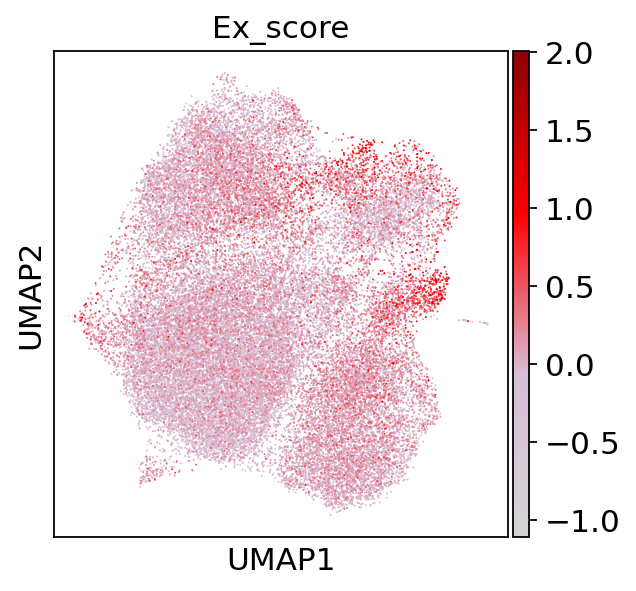

In [4]:
sc.pl.umap(adata, color='Ex_score', color_map=cmap)

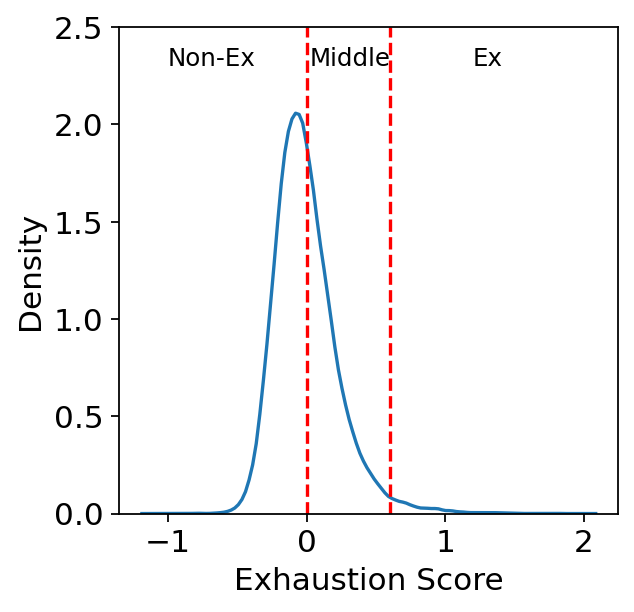

In [22]:
import seaborn as sns
fig, ax = plt.subplots()
sns.kdeplot(adata.obs['Ex_score'], ax=ax)
plt.text(-1, 2.3, 'Non-Ex', fontsize=11)
plt.text(0.02, 2.3, 'Middle', fontsize=11)
plt.text(1.2, 2.3, 'Ex', fontsize=11)
ax.grid(False)
ax.axvline(0.6, c='red', linestyle='--')
ax.axvline(0, c='red', linestyle='--')
#ax.set_title('Exhaustion Score')
ax.get_legend().remove()
ax.set_ylim([0,2.5])
ax.set_ylabel('Density')
ax.set_xlabel('Exhaustion Score')
plt.savefig('./figures/Exscore_cutoff.pdf')

In [61]:
ExCells = np.array(['Middle']*adata.shape[0])
ExCells[adata.obs['Ex_score']>0.6] = 'Ex'
ExCells[adata.obs['Ex_score']<0] = 'Non-Ex'

In [88]:
adata.obs['ExCells'] = ExCells
adata.uns['ExCells_colors'] = ['#ff0000', '#FFFF00',  '#0000FF']

In [4]:
pd.crosstab(adata.obs['ExCells'], adata.obs['leiden_v1'])

leiden_v1,L2_1,L2_2,L2_3,L2_4,L2_5,L2_6,L2_7,L2_8,L2_9,L2_10,L2_11
ExCells,,,,,,,,,,,
Ex,263,6,12,118,24,23,22,6,232,45,1
Middle,1542,261,584,3692,2687,2179,336,82,720,3710,3
Non-Ex,1593,436,981,4489,5209,4705,110,86,199,3519,23


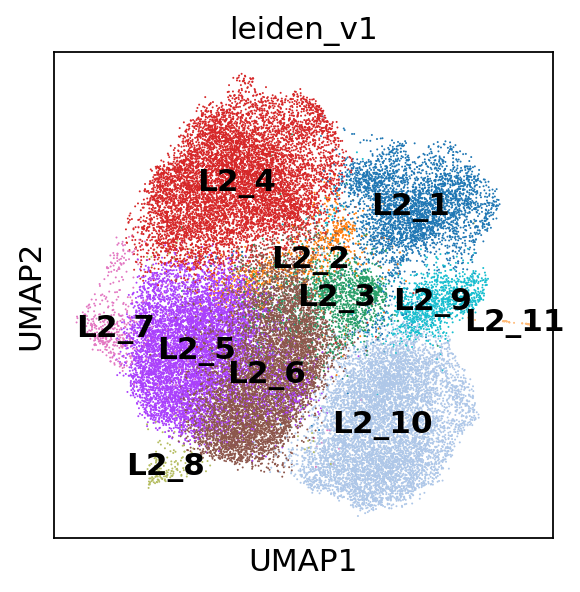

In [71]:
sc.pl.umap(adata, color='leiden_v1', color_map=cmap, legend_loc='on data')

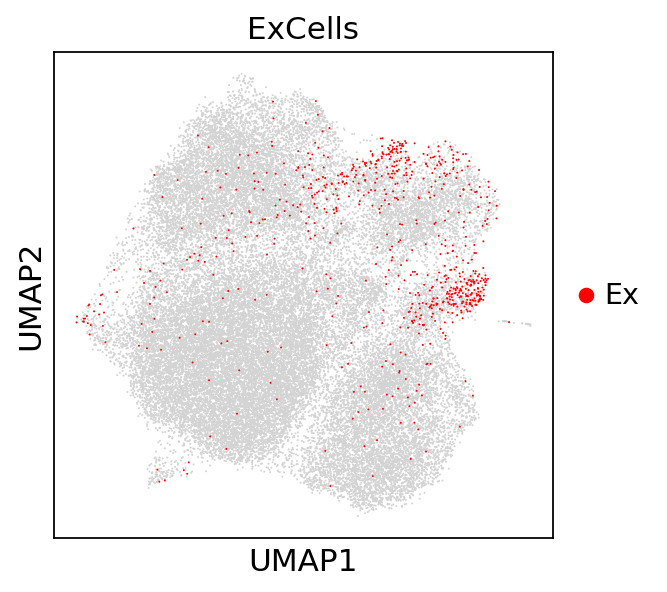

In [81]:
sc.pl.umap(adata, color='ExCells', groups=['Ex'], color_map=cmap)

In [36]:
Ex_genes = ['PDCD1', 'HAVCR2', 'LAG3', 'CTLA4', 'CD44', 'SPN', 'CD69', 'PRDM1', 'IL10', 'IL27', 'EBI3', 'KLRG1', 'TIGIT', 'CD244', 'CD160']

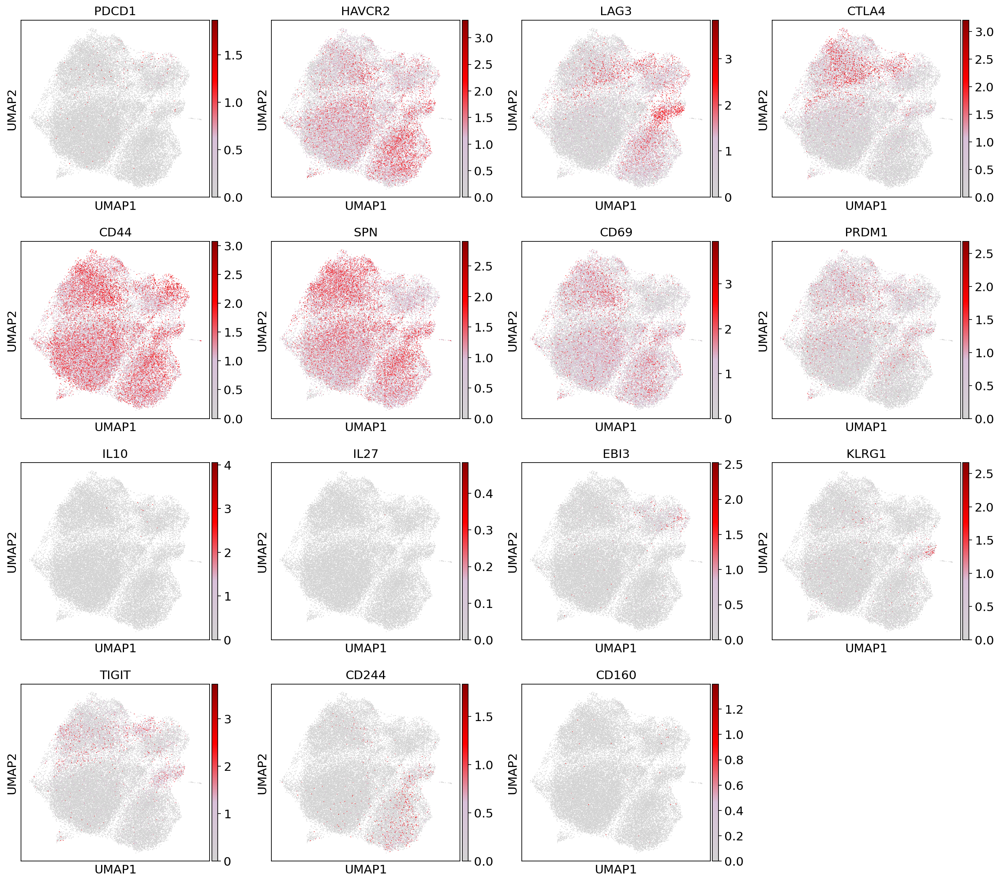

In [38]:
sc.pl.umap(adata, color=Ex_genes, color_map=cmap)

In [43]:
nonExG = ['IL7R', 'SELL', 'IL2', 'TNF', 'IFNG', 'GZMB']

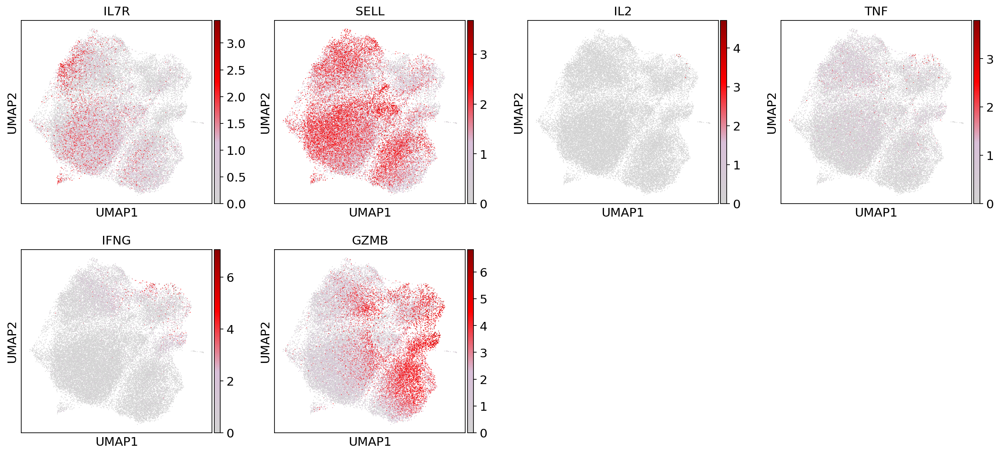

In [44]:
sc.pl.umap(adata, color=nonExG, color_map=cmap)

In [82]:
adata.write('./write/Tcells_processed_regressedout.h5ad')

# Try cluster out Ex from L2_1

In [14]:
adata = sc.read('./write/Tcells_processed_regressedout.h5ad')

In [15]:
adata = adata[adata.obs['leiden_v1'] == 'L2_1'].copy()
adata = anndata.AnnData(X=adata.raw.X, obs=adata.obs, var=adata.raw.var)
adata.raw =adata

extracting highly variable genes
    finished (0:00:10)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


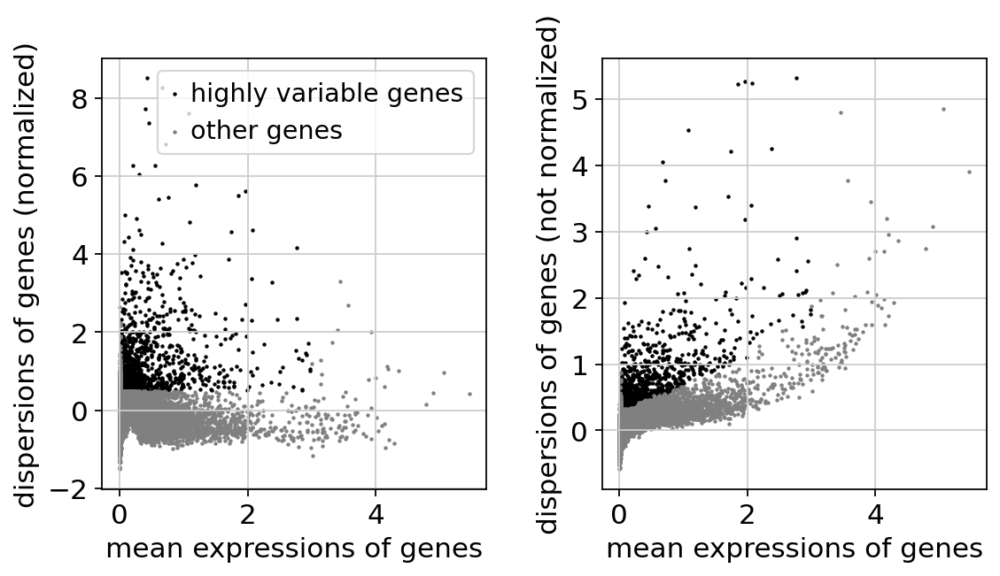

1630


In [16]:
# find highly variable genes
# parameters are mainly selected depends on user preference
sc.pp.highly_variable_genes(
    adata, min_mean=0.02, max_mean=3, min_disp=0.5, batch_key='batch', inplace=True)
sc.pl.highly_variable_genes(adata)
print(np.sum(adata.var.highly_variable))

In [17]:
adata = adata[:, adata.var.highly_variable]

In [18]:
adata.shape

(3398, 1630)

In [19]:
adata.write('./write/Tcells_L2_1_lognorm_HVG_afterQC.h5ad')

In [20]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:15)


In [22]:
# scale for pca
sc.pp.scale(adata)
# first try pca
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata)
sc.tl.umap(adata)
adata.write('./write/Tcells_L2_1_processed.h5ad')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:05)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


In [4]:
adata = sc.read('./write/Tcells_L2_1_processed.h5ad')

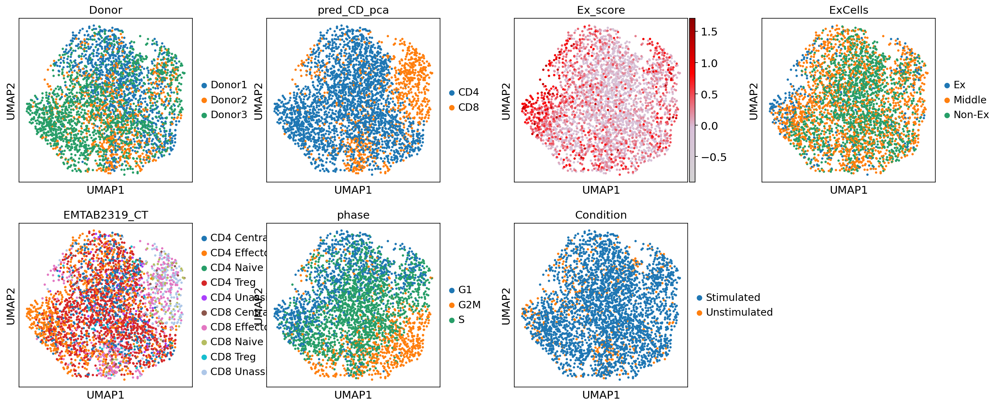

In [47]:
sc.pl.umap(adata, color=['Donor','pred_CD_pca', 'Ex_score', 'ExCells','EMTAB2319_CT', 'phase', 'Condition'], color_map=cmap, wspace=0.3)

In [5]:
# regress out cell cycle
adata =sc.read('./write/Tcells_L2_1_lognorm_HVG_afterQC.h5ad')
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt', 'G2M_score', 'S_score', 'n_genes_by_counts'])
# scale for pca
sc.pp.scale(adata)
# first try pca
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata)
sc.tl.umap(adata)
adata.write('./write/Tcells_L2_1_processed_regressout.h5ad')

regressing out ['total_counts', 'pct_counts_mt', 'G2M_score', 'S_score', 'n_genes_by_counts']
    sparse input is densified and may lead to high memory use
    finished (0:00:07)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)


In [2]:
adata = sc.read('./write/Tcells_L2_1_processed_regressout.h5ad')

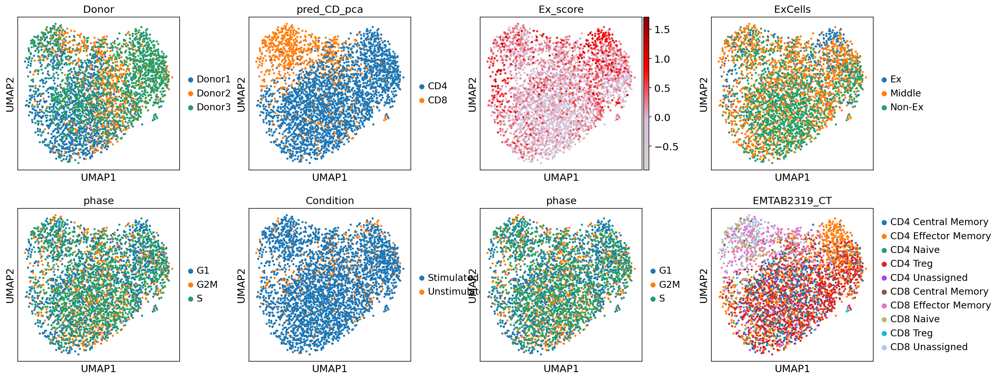

In [87]:
sc.pl.umap(adata, color=['Donor','pred_CD_pca', 'Ex_score', 'ExCells', 'phase', 'Condition','phase','EMTAB2319_CT'], color_map=cmap, wspace=0.3)

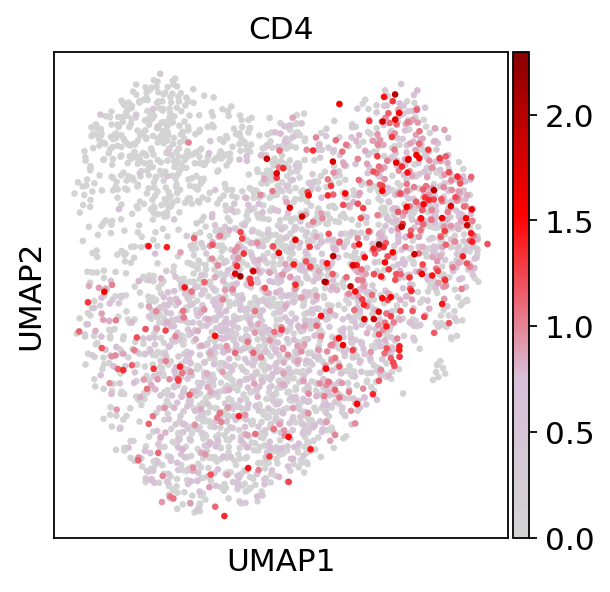

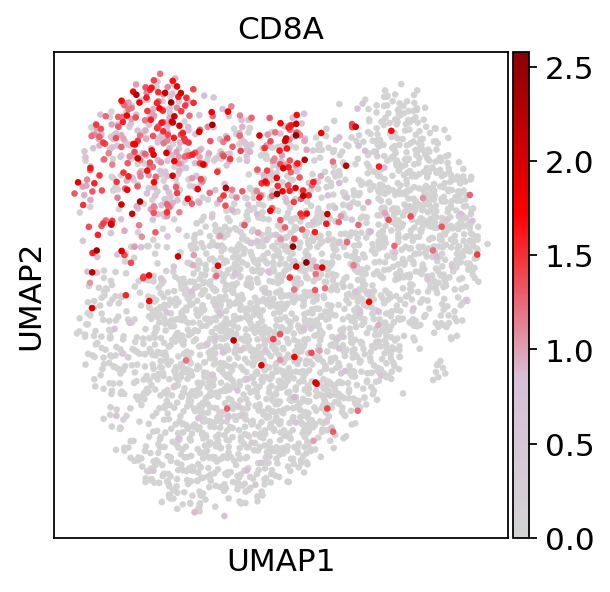

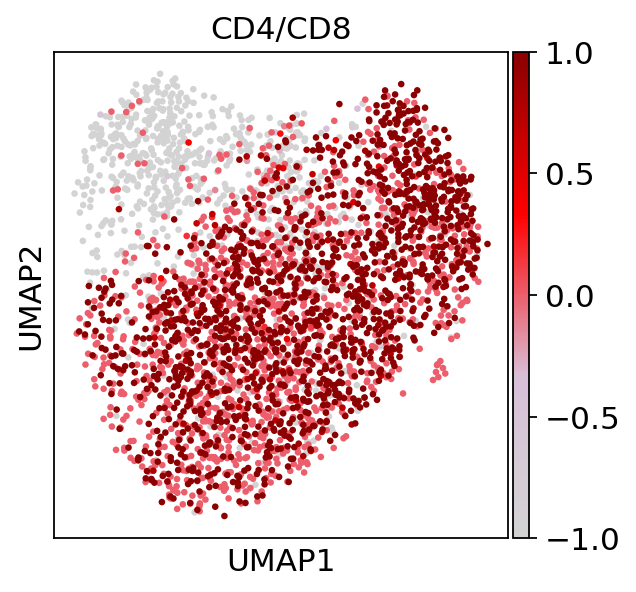

In [6]:
sc.pl.umap(adata, color=['CD4'], color_map = cmap, save='_L2_1_CD4.pdf')
sc.pl.umap(adata, color=['CD8A'], color_map = cmap, save='_L2_1_CD8A.pdf')
sc.pl.umap(adata, color=['CD4/CD8'], color_map = cmap, save='_L2_1_CD4CD8ratio.pdf')

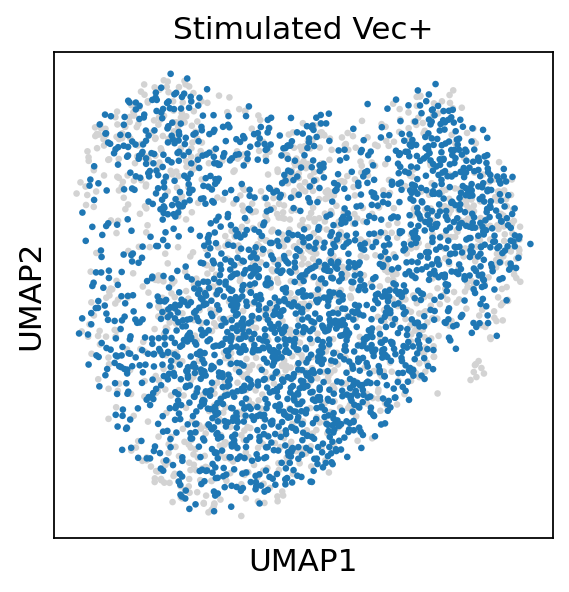

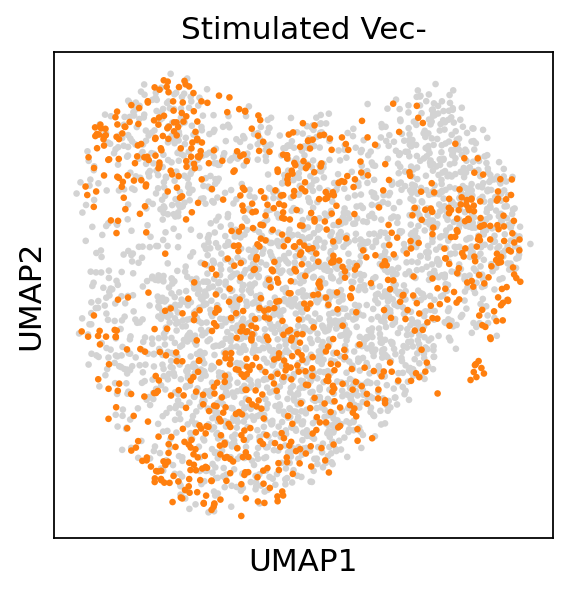

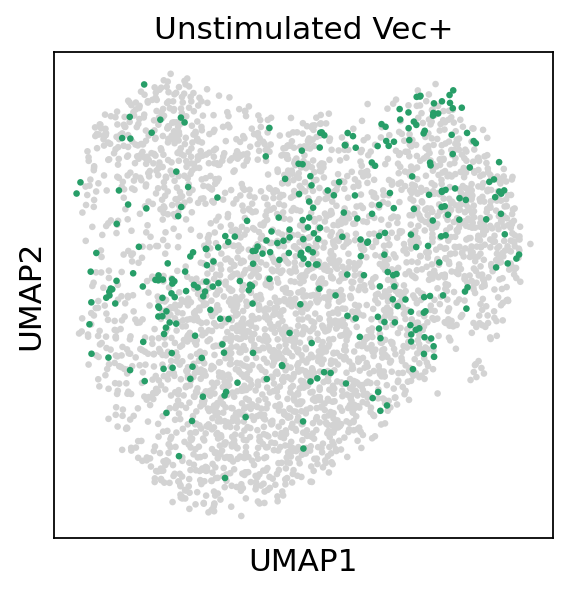

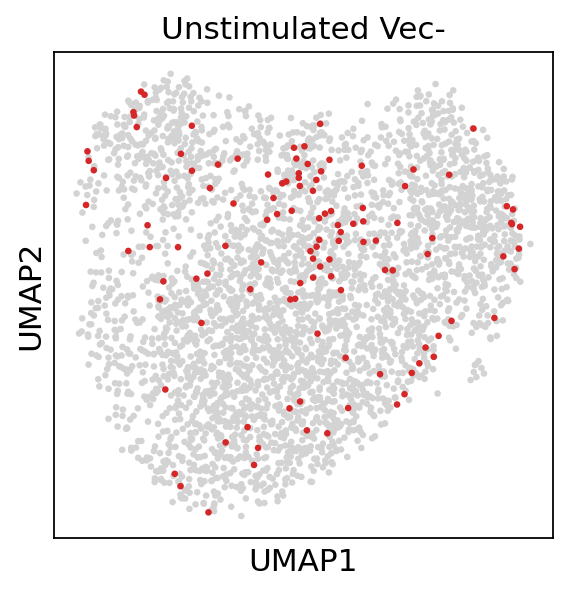

In [7]:
for i in range(len(list(adata.obs['Sub_con'].cat.categories))):
    sc.pl.umap(adata, color='Sub_con', groups=np.unique(adata.obs['Sub_con'])[i], legend_loc=None, title=np.unique(adata.obs['Sub_con'])[i], save='_Tcells_Sub_con_'+np.unique(adata.obs['Sub_con'])[i])

In [7]:
sc.tl.leiden(adata, resolution=0.5, key_added='leiden_v2')

running Leiden clustering
    finished: found 5 clusters and added
    'leiden_v2', the cluster labels (adata.obs, categorical) (0:00:00)


In [8]:
adata.obs['leiden_v2'] = adata.obs['leiden_v2'].astype('category')
adata.obs['leiden_v2'].cat.categories

Index(['0', '1', '2', '3', '4'], dtype='object')

In [9]:
adata.obs['leiden_v2'] = adata.obs['leiden_v2'].cat.rename_categories(['L3_5', 'L3_3', 'L3_4', 'L3_1', 'L3_2'])

In [10]:
adata.obs['leiden_v2'] = adata.obs['leiden_v2'].cat.reorder_categories(['L3_1', 'L3_2', 'L3_3', 'L3_4', 'L3_5'])

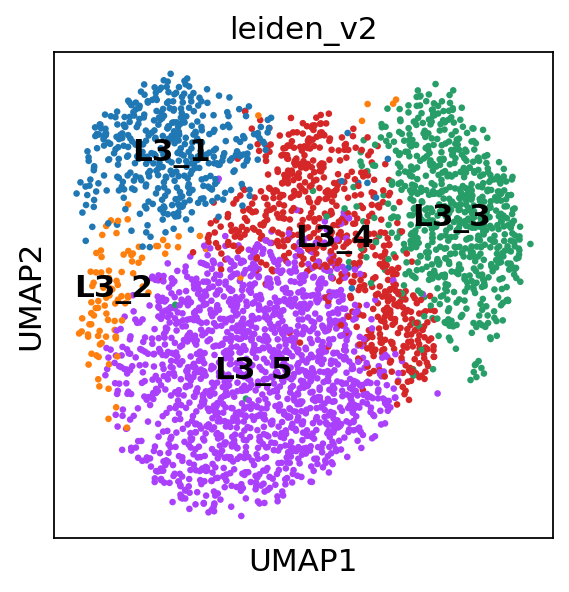

In [11]:
sc.pl.umap(adata, color=['leiden_v2'], color_map=cmap, legend_loc='on data', save='_L2_1_leiden_v2.pdf')

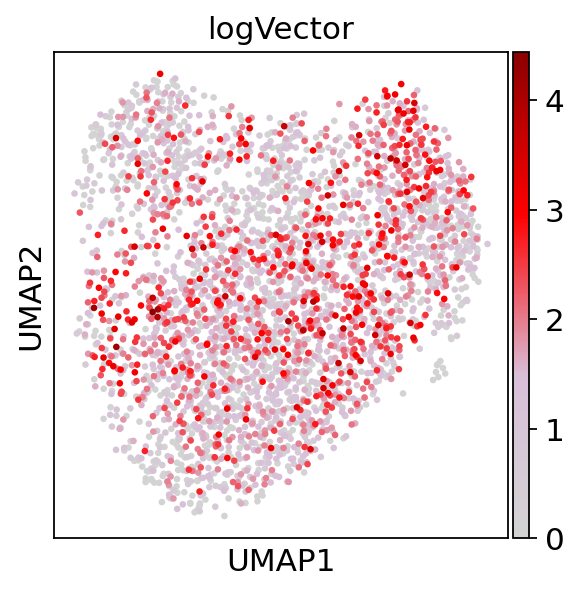

In [18]:
sc.pl.umap(adata, color=['logVector'], color_map=cmap, legend_loc='on data', save='_L2_1_logVector.pdf')

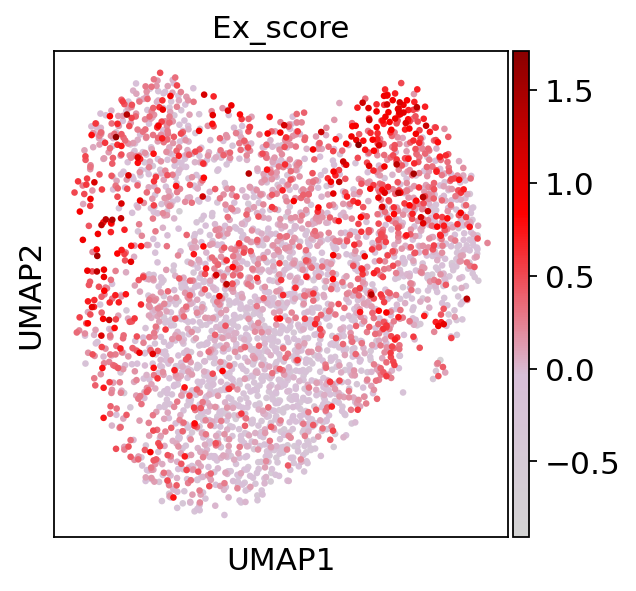

In [24]:
sc.pl.umap(adata, color=['Ex_score'], color_map=cmap, legend_loc='on data', save='_L2_1_ExCells.pdf')

# Sti CAR+ vs Sti CAR-

In [5]:
adata = sc.read('./write/Tcells_L2_1_processed_regressout.h5ad')

In [30]:
adata.obs['Sub_con'].value_counts(normalize=True)*100

Stimulated Vec+      61.918776
Stimulated Vec-      25.809300
Unstimulated Vec+     8.917010
Unstimulated Vec-     3.354915
Name: Sub_con, dtype: float64

In [6]:
sc.tl.rank_genes_groups(adata, groupby='Sub_con', reference='Stimulated Vec-', groups=['Stimulated Vec+'], n_genes=adata.raw.shape[1], method='t-test', key_added='DE_StiVecPvsStiVecN')

ranking genes
    finished: added to `.uns['DE_StiVecPvsStiVecN']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


(3398, 1630)
(3398, 21801)


/home/xw251/miniconda3/envs/scanpy_py368/lib/python3.6/site-packages/smqpp/__init__.py:716: RuntimeWarning: divide by zero encountered in log2
  logExp = np.log2(normExp)


upRegulated gene: 16
downRegulated gene: 4


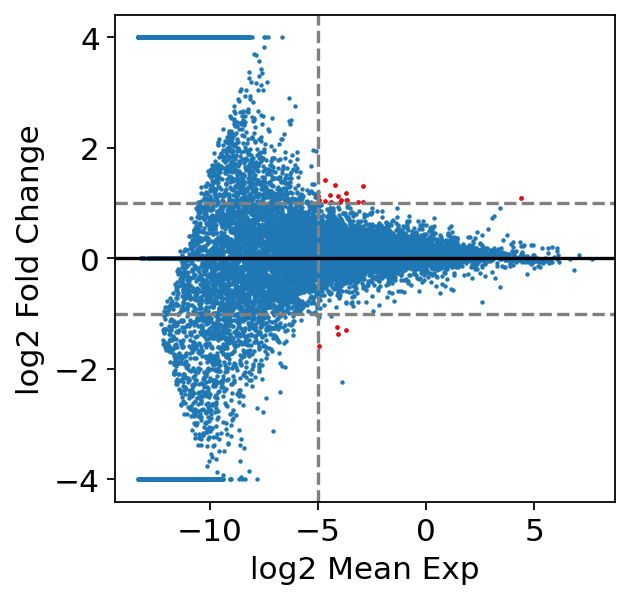

In [8]:
import smqpp
upG, downG, tableG = smqpp.plot_ma(adata, 'DE_StiVecPvsStiVecN', cidx=0, padj_cutoff=0.05, logFC_cutoff=1, exp_cutoff=-5)

In [9]:
np.savetxt('./DEres/L2_1_StiVecPvsStiVecN/L2_1_StiVecPvsStiVecN_upG.txt', upG, delimiter='\t', fmt='%s')
np.savetxt('./DEres/L2_1_StiVecPvsStiVecN/L2_1_StiVecPvsStiVecN_downG.txt', downG, delimiter='\t', fmt='%s')
tableG.to_csv('./DEres/L2_1_StiVecPvsStiVecN/L2_1_StiVecPvsStiVecN_table.csv')

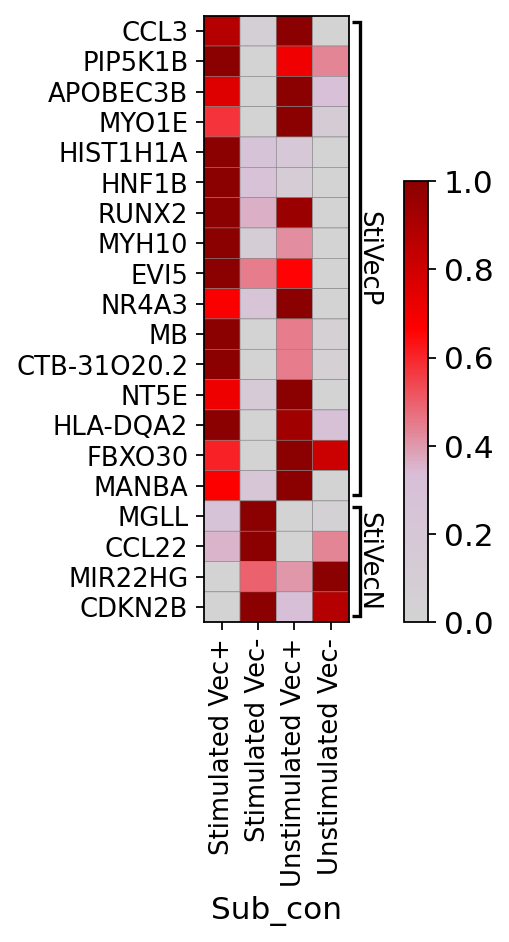

GridSpec(2, 3, height_ratios=[0, 4.0], width_ratios=[1.2, 0.4, 0.2])

In [24]:
GL = {
    'StiVecP': upG,
    'StiVecN': downG
}
sc.pl.matrixplot(adata, groupby='Sub_con', var_names=GL, swap_axes=True, standard_scale='var', cmap=cmap, save='_L2_1_StiVecPvsStiVecN.pdf')

In [25]:
adata.write('./write/Tcells_L2_1_processed_regressout.h5ad')

# Exhaustion

In [4]:
adata = sc.read('./write/Tcells_L2_1_processed_regressout.h5ad')

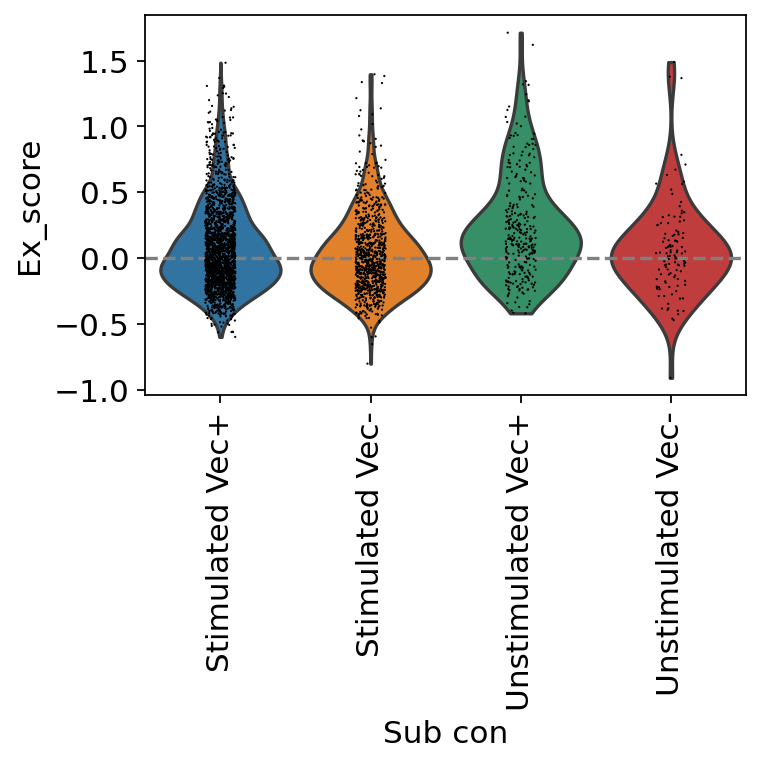

In [34]:
# plot sub_con and Ex score
fig, ax = plt.subplots(figsize=(5,5))
sc.pl.violin(adata, keys='Ex_score', groupby='Sub_con', show=False, ax=ax)
ax.grid(False)
ax.axhline(0, c='grey', linestyle='--')
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('./figures/Violinplot_L2_1_Exscore_Subcon.pdf')

In [12]:
print("L3_1 cells: "+str(np.sum(adata.obs['leiden_v2']=='L3_1')))
print("Remaining cells: "+str(np.sum(adata.obs['leiden_v2']!='L3_1')))

L3_1 cells: 413
Remaining cells: 2985


In [46]:
sc.tl.rank_genes_groups(adata, groupby='leiden_v2', n_genes=adata.raw.shape[1], groups=['L3_1'], key_added='DE_leiden_v2', method='t-test')

ranking genes
    finished: added to `.uns['DE_leiden_v2']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


(3398, 1630)
(3398, 21801)
upRegulated gene: 114
downRegulated gene: 248


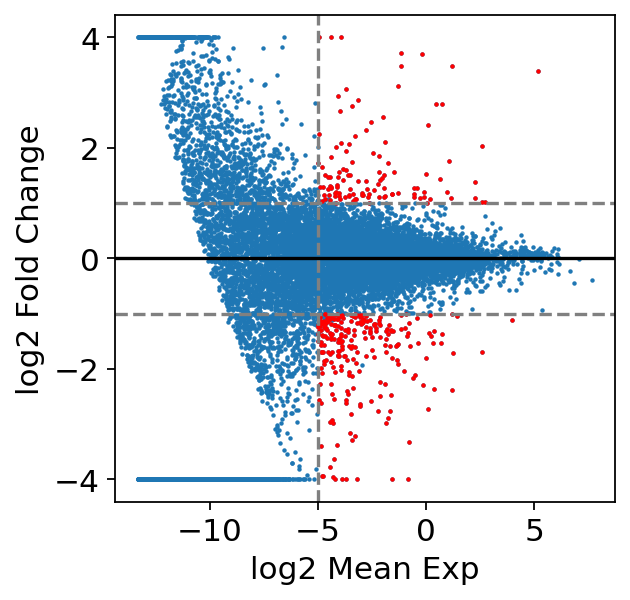

In [50]:
import smqpp
upG, downG, tableG = smqpp.plot_ma(adata, 'DE_leiden_v2', cidx=0, padj_cutoff=0.05, logFC_cutoff=1, exp_cutoff=-5, save='./figures/MA_L2_1_L3_1vsres.pdf')

In [48]:
np.savetxt('./DEres/L2_1_L3_1vsrest/L3_1vsrest_upG.txt', upG, delimiter='\t', fmt='%s')
np.savetxt('./DEres/L2_1_L3_1vsrest/L3_1vsrest_downG.txt', downG, delimiter='\t', fmt='%s')
tableG.to_csv('./DEres/L2_1_L3_1vsrest/L2_2vsL2_1_table.csv')

array(['GZMB', 'NKG7', 'CD8A', 'CD8B', 'CTSW', 'XCL1', 'HOPX', 'BATF3',
       'CD48', 'GZMA', 'TNFSF10', 'LAG3', 'XCL2', 'AC092580.4', 'CRTAM',
       'CD55', 'DHRS3', 'AIF1', 'ITM2C', 'TIMD4', 'RP11-277P12.20',
       'RGS16', 'YBX3', 'PRF1', 'KRT7', 'CSF2', 'HAVCR2', 'SLAMF7',
       'SERPINB9', 'HRH2', 'STAG3', 'RP11-291B21.2', 'DBN1', 'KLRC1',
       'FXYD2', 'TNFRSF9', 'BCAS4', 'SEMA4A', 'REG4', 'KLRD1', 'AFAP1L2',
       'FASLG', 'CSF1', 'TBX21', 'CD97', 'EOMES', 'KLF13', 'RAB13',
       'ICAM1', 'PAG1', 'FSCN1', 'PHGDH', 'PRKAR1B', 'PDLIM4', 'RIN3',
       'COL6A2', 'GPR114', 'P4HA2', 'GZMH', 'HEG1', 'GPR35', 'IFITM3',
       'MLLT11', 'IFNG', 'TAGAP', 'NELL2', 'NTRK1', 'RNF125', 'PTGIS',
       'GZMK', 'EHBP1L1', 'C1orf228', 'SNX18', 'DTX3L', 'NPW', 'CCL22',
       'IRF2BPL', 'MCOLN2', 'TNFSF4', 'COL6A1', 'CCL1', 'PITPNC1',
       'FILIP1L', 'CCDC152', 'IGFBP4', 'MCTP2', 'KLHL23', 'PIP5K1C',
       'ATAD2B', 'LPAR5', 'AC002454.1', 'CPD', 'NEK8', 'PLEKHA1', 'PRKD3',
       'HVC

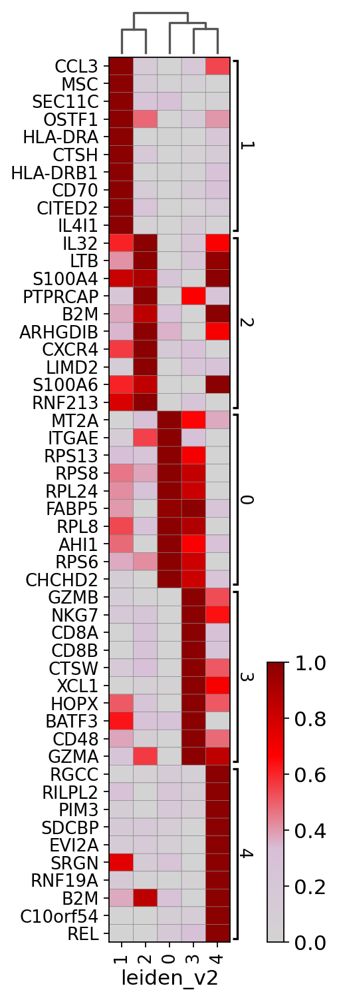

In [113]:
sc.pl.rank_genes_groups_matrixplot(adata, key='DE_leiden_v2',groupby='leiden_v2', n_genes=10, cmap=cmap, standard_scale='var',swap_axes=True, save='_Tcells_L2_1_Top10_GL.pdf')

In [13]:
adata.write('./write/Tcells_L2_1_processed_regressout.h5ad')

In [95]:
# quick annotation
import smqpp
adata = sc.read('./write/Tcells_L2_1_processed_regressout.h5ad')
temp = adata.raw 
del adata.raw
import anndata
adata.raw = anndata.AnnData(X=temp.X.toarray(), var=temp.var, obs=adata.obs)
del temp
with open('/home/xw251/rds/rds-bg200-hphi-gottgens/users/xw251/Files/Pathway_DB/c2.all.v7.1.symbols.gmt') as f:
    DBcont = f.readlines()
DBcont = np.array(DBcont)
DBcont = DBcont[[(('BIOCARTA_' in x) | ('REACTOME_' in x) | ('PID_' in x) | ('KEGG_' in x) | ('HALLMARK_' in x)) for x in DBcont]]
c2DBres = smqpp.pathway_score_cal(adata, DBcont)
c2DB = anndata.AnnData(c2DBres, obs=adata.obs,  obsm=adata.obsm)
c2DB.var_names = [x[0:40] for x in c2DBres.columns]
c2DB.var_names_make_unique()
sc.tl.rank_genes_groups(c2DB, 'leiden_v2', n_genes=c2DB.shape[1], key_added='DE_leiden_v2', method='t-test')

ranking genes
    finished: added to `.uns['DE_leiden_v2']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


Index(['0', '1', '2', '3', '4'], dtype='object')
0
(3398, 2019)
(3398, 2019)
upRegulated gene: 3
downRegulated gene: 25


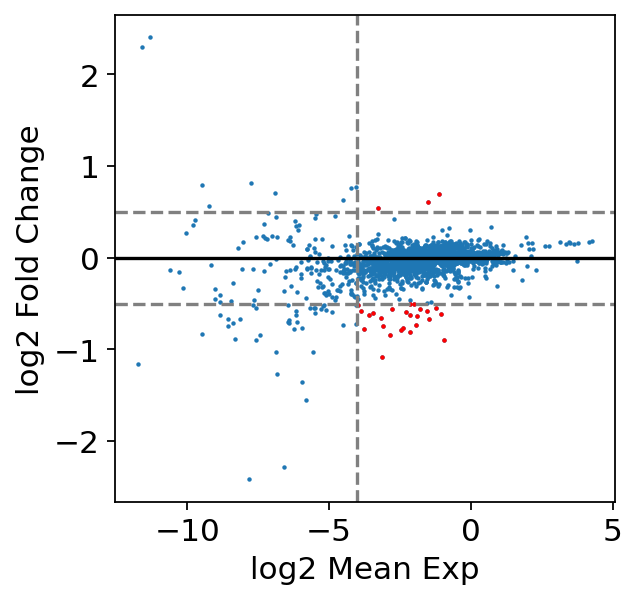

1
(3398, 2019)
(3398, 2019)
upRegulated gene: 30
downRegulated gene: 5


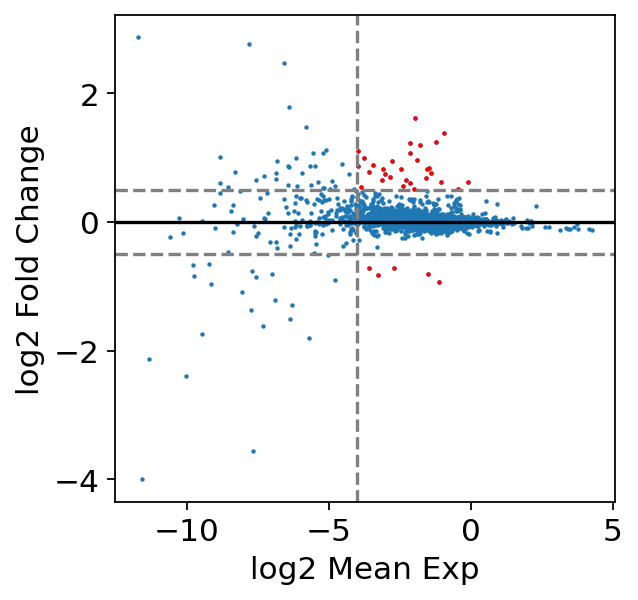

2
(3398, 2019)
(3398, 2019)
upRegulated gene: 4
downRegulated gene: 6


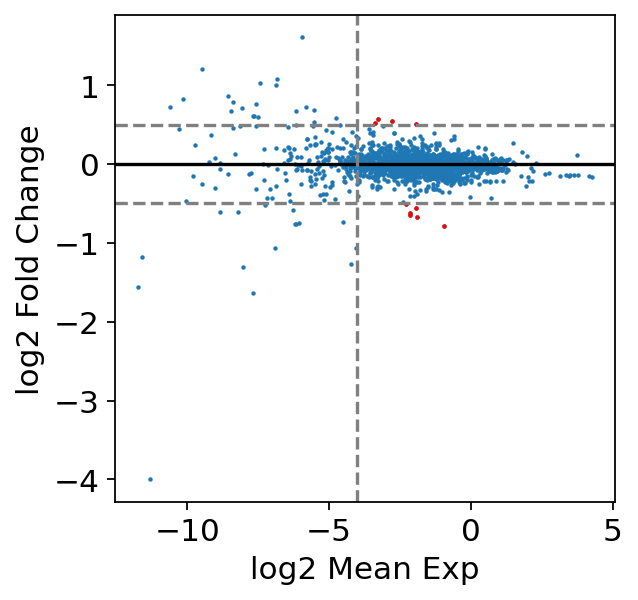

3
(3398, 2019)
(3398, 2019)
upRegulated gene: 8
downRegulated gene: 7


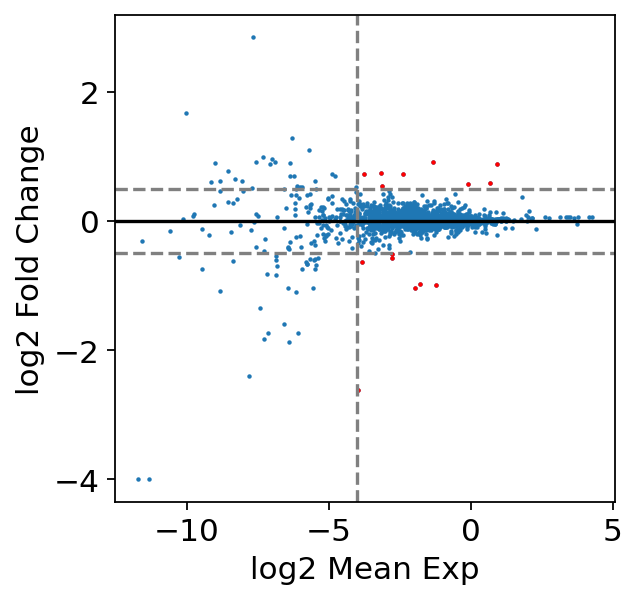

4
(3398, 2019)
(3398, 2019)
upRegulated gene: 61
downRegulated gene: 52


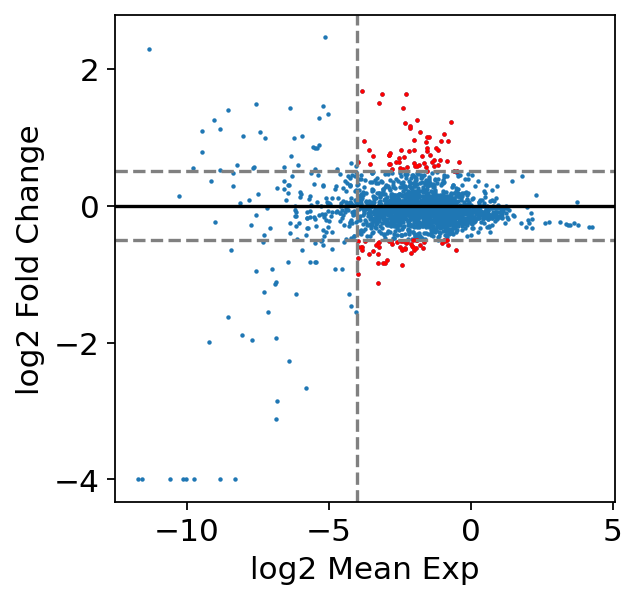

In [96]:
cat = c2DB.obs['leiden_v2'].cat.categories
print(cat)
c2DB.raw= c2DB
for x in range(len(cat)):
    print(x)
    upG, downG, tableG = smqpp.plot_ma(c2DB, 'DE_leiden_v2',cidx=int(x), padj_cutoff=0.05, logFC_cutoff=0.5, exp_cutoff=-4)
    np.savetxt('Pathway/Tcells_L2_1_leiden_v2_c2DB/'+cat[x]+'vsAll_upG.txt', upG, delimiter='\t', fmt='%s')
    np.savetxt('Pathway/Tcells_L2_1_leiden_v2_c2DB/'+cat[x]+'vsAll_downG.txt', downG, delimiter='\t', fmt='%s')
    tableG.to_csv('Pathway/Tcells_L2_1_leiden_v2_c2DB/'+cat[x]+'vsAll_table.csv')

In [98]:
c2DB.write('./write/Tcells_L2_1_c2DB.h5ad')

In [ ]:
c2DB = sc.read('./write/Tcells_L2_1_c2DB.h5ad')

In [107]:
import os
import re
GL2plot = {}
files = np.array(os.listdir('./Pathway/Tcells_L2_1_leiden_v2_c2DB/'))
files = files[['upG' in x for x in files]]
print(files)
for f in sorted(files):
    cl = re.search('\d+' , f)[0]
    GL2plot[cl] = np.genfromtxt('./Pathway/Tcells_L2_1_leiden_v2_c2DB/'+f, dtype=str, delimiter='\t')[0:5]

['1vsAll_upG.txt' '3vsAll_upG.txt' '4vsAll_upG.txt' '2vsAll_upG.txt'
 '0vsAll_upG.txt']


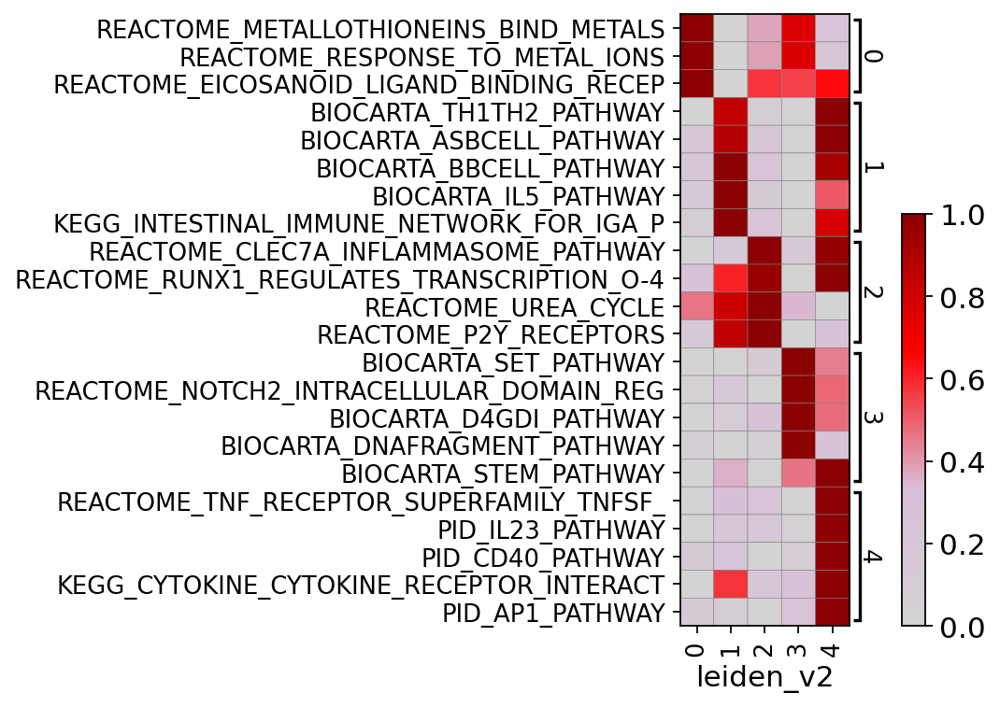

GridSpec(2, 3, height_ratios=[0, 4.4], width_ratios=[1.5, 0.4, 0.2])

In [114]:
sc.pl.matrixplot(c2DB, var_names=GL2plot, groupby='leiden_v2', standard_scale='var', cmap=cmap, swap_axes=True, save='_Tcells_L2_1_TopPathways.pdf')